# Computer Vision color spaces

### Import statements

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [3]:
def imshow(img):
    plt.figure(figsize=(15,15))
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

### To edit an image making a copy of it is always a good idea!

In [4]:
# Load an image
# And make a copy of the original image to avoid manipulating the original image

img = cv2.imread("img/tulups.jpg")
copy_img=img.copy()

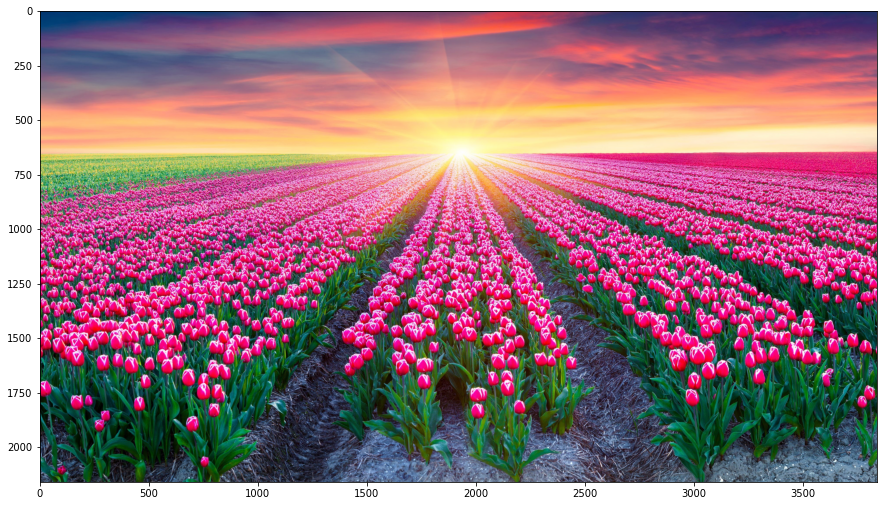

In [78]:
imshow(img)

[Hint](# "Numpy .copy function") 

## Color Spaces

### BGR Spliting the color channels

In [5]:
# Load a color image and split in is different B, G and R channels
b,g,r = cv2.split(copy_img)

[Hint](# "cv2.split") 

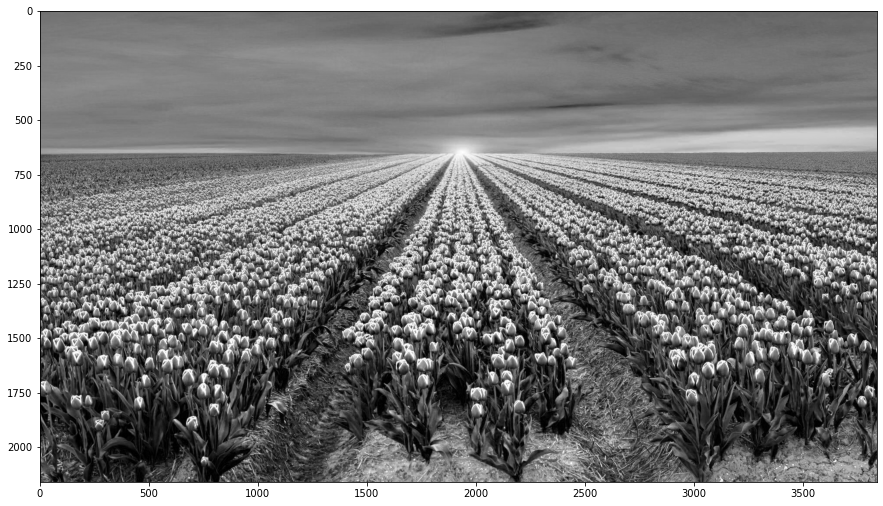

In [6]:
# Show each channel channel on screen
imshow(b)

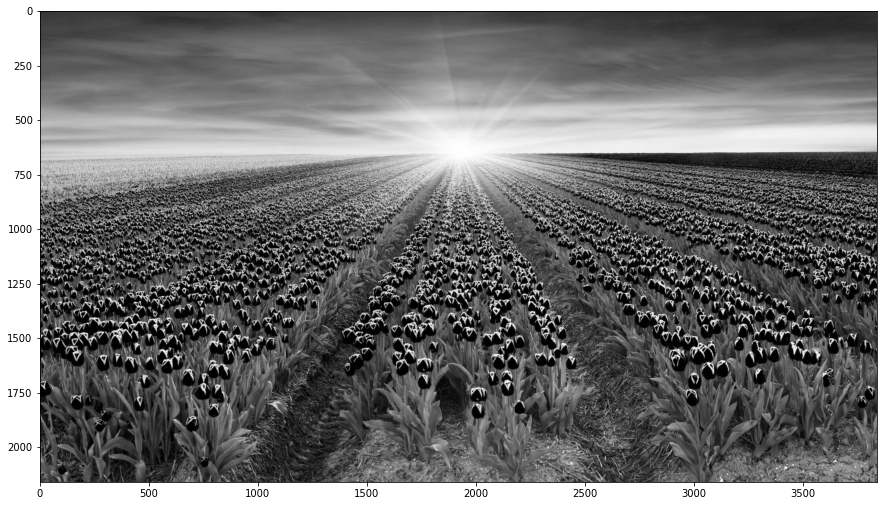

In [13]:
imshow(g)

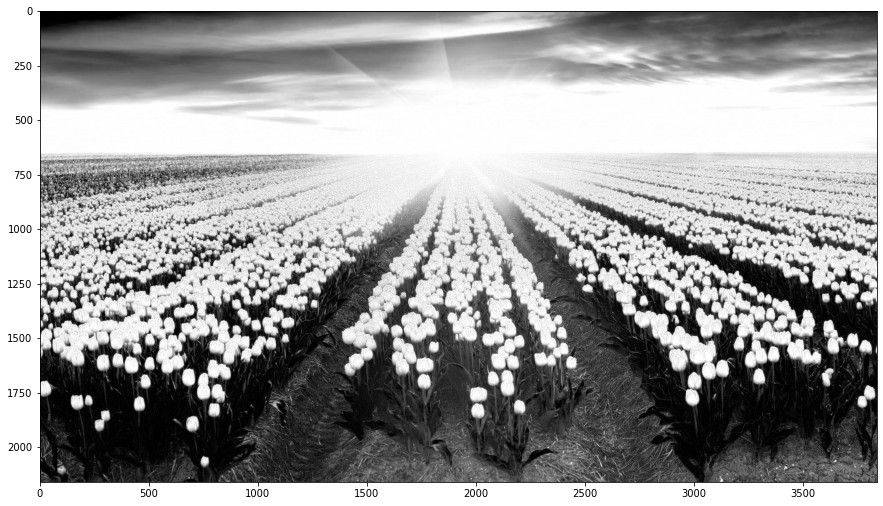

In [14]:
imshow(r)

#### Merging the color channels

In [7]:
# Modify a channel and then merge them all again
merged=cv2.merge((b,g,r))

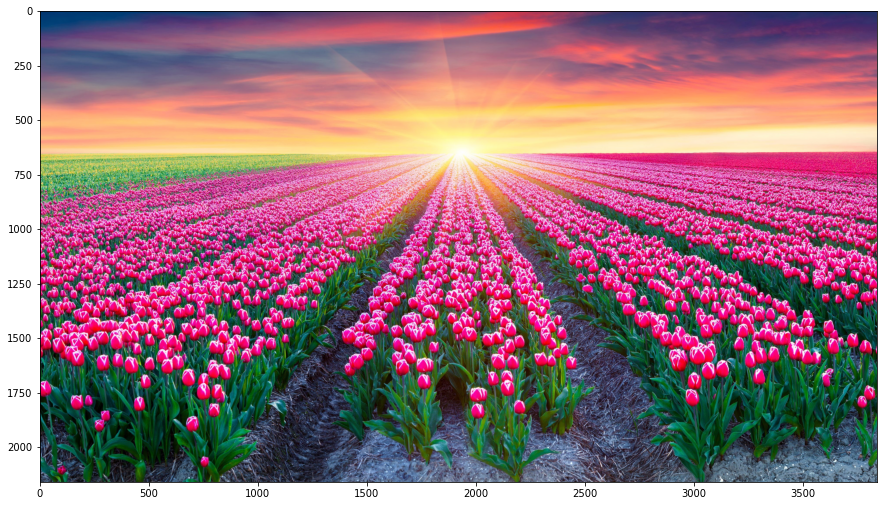

In [17]:
imshow(merged)

[Hint](# "cv2.merge") 

In [8]:
img = cv2.imread("img/tulups.jpg")
copy_img=img.copy()

In [9]:
# Create a black canvas with the same size as the image you loaded
zeros = np.zeros(r.shape).astype('uint8')

In [89]:
# Merge each channel with the black canvas 
# So you will end up with 3 images: (Red,Black,Black), (Black,Green,Black) and (Black,Black,Blue) 
# Assuming you are working with RGB, but BGR is also fine

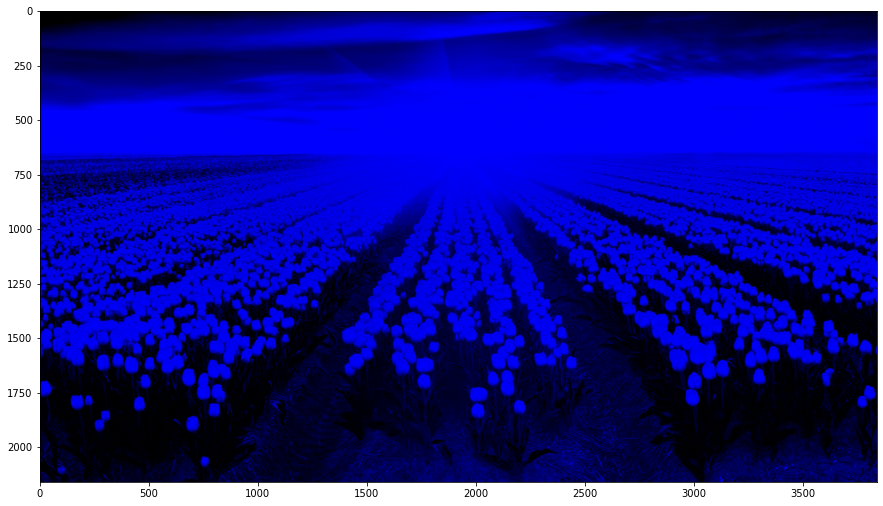

In [87]:
blue=cv2.merge([r,zeros,zeros])
imshow(blue)

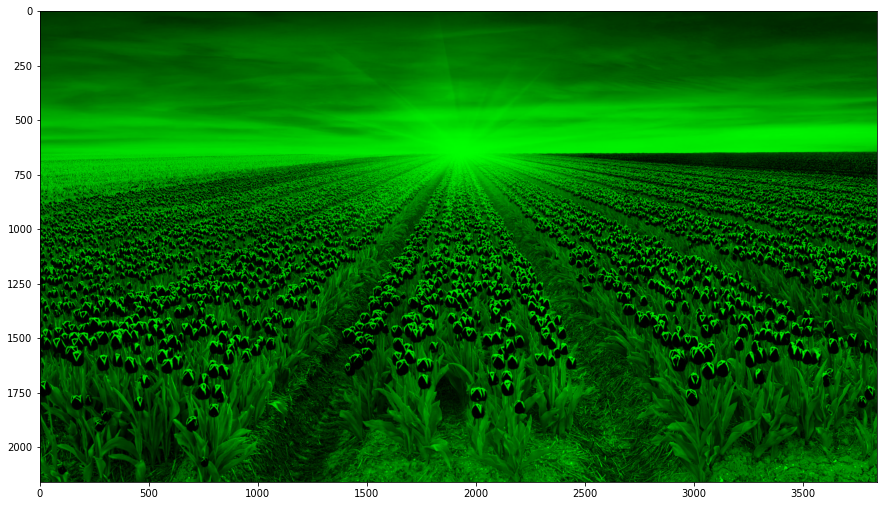

In [85]:
green=cv2.merge([zeros,g,zeros])
imshow(green)

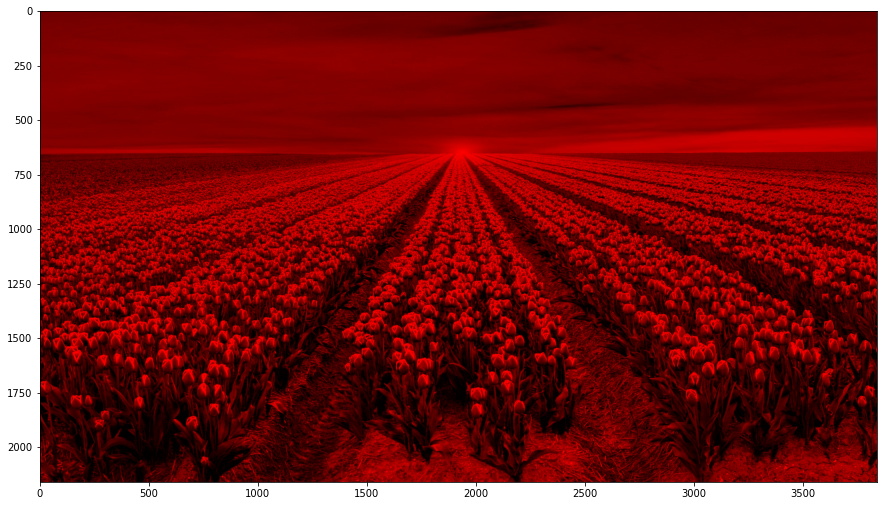

In [88]:
red=cv2.merge([zeros,zeros,b])
imshow(red)

[Hint](# "use numpy np.zeros function with the img.shape[:2]") 

[Hint](# "cv2.merge") 

### HSV: Hue Saturation Value

#### M&Ms challenge!

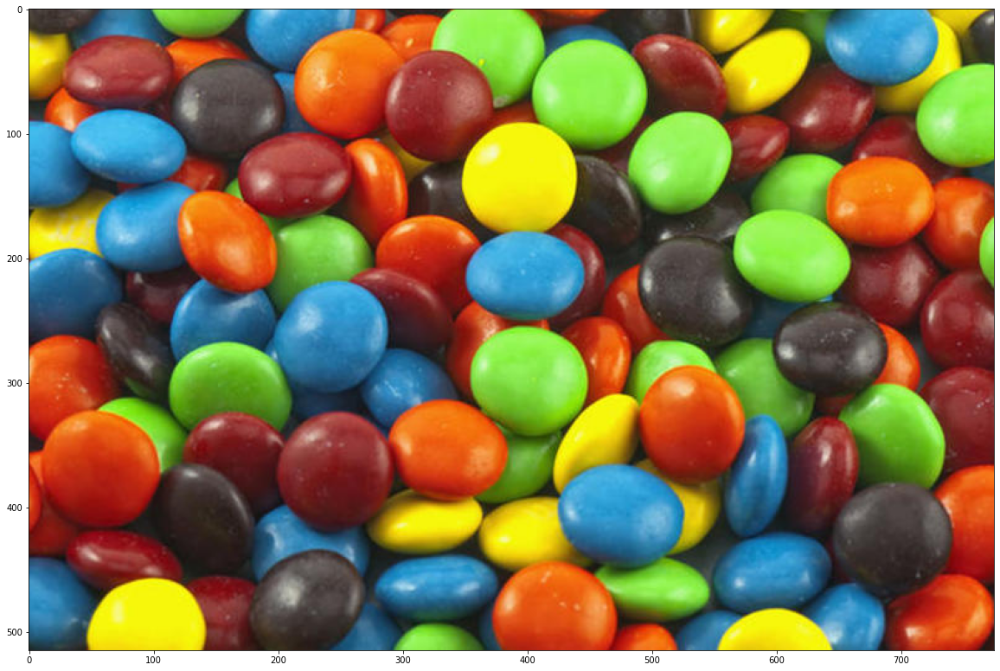

In [41]:
# Use the image below and convert it from BGR to HSV
img = cv2.imread('img/m.jpg')
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB));

In [39]:
copy_img=img.copy()

In [40]:
# Split the H,S and V channels 
hsv=cv2.cvtColor(copy_img, cv2.COLOR_BGR2HSV)
H,S,V=cv2.split(hsv)

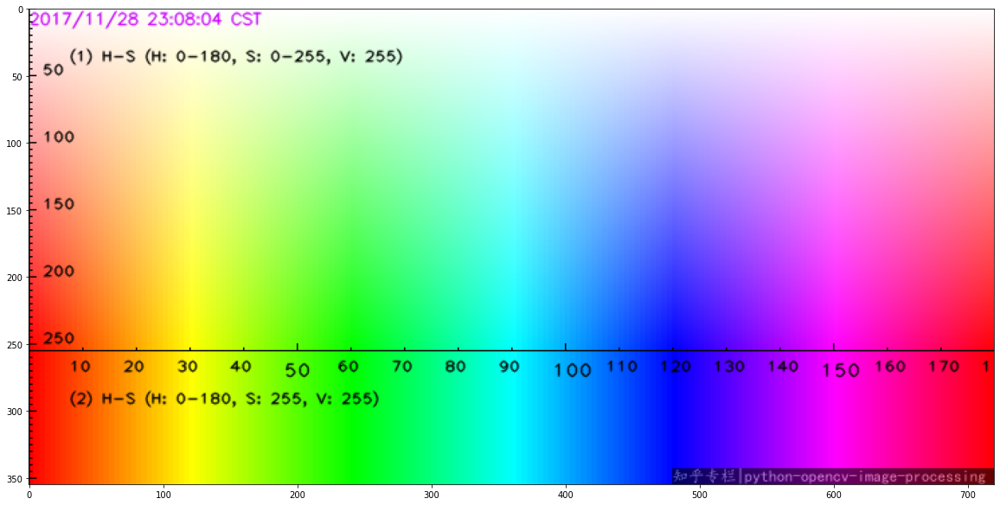

In [29]:
hsv_map= cv2.imread('./img/hsv.png')
plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(hsv_map,cv2.COLOR_BGR2RGB))

[Hint](# "cv2.cvtColor") 

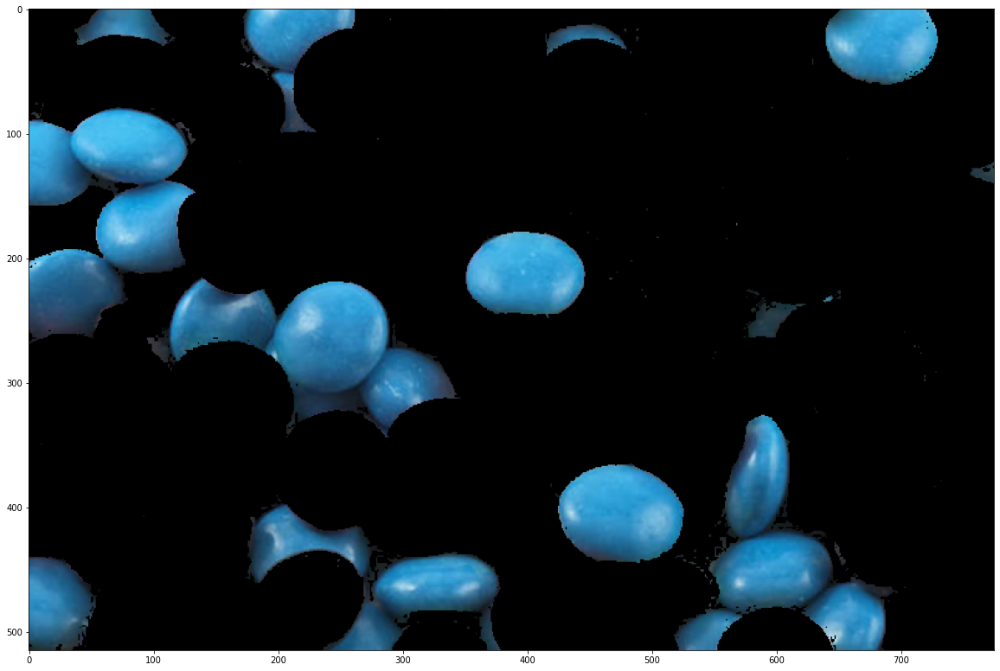

In [43]:
# Create a mask to filter out the Blue M&Ms (remember you need a lower and upper range)
# Make a copy of the hsv image and apply the mask to it, then display the image
lower_blue = (93, 20, 0)#lower range of hsv map
upper_blue = (138, 255, 255)#Retangular shapes on the hsv map

mask_blue = cv2.inRange(hsv, lower_blue, upper_blue)
masked_field = img.copy()

masked_field[mask_blue == 0] = [0, 0, 0]

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(masked_field,cv2.COLOR_BGR2RGB));

[Hint](# "cv2.inRange") 

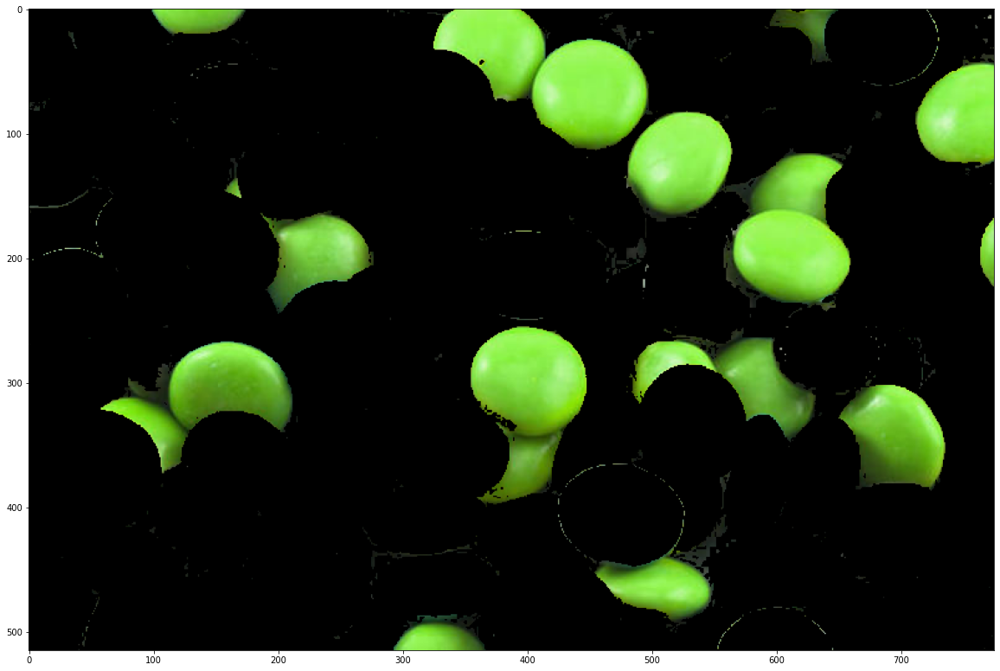

In [44]:
# Repeat the same but now with the greens
lower_range=(38,20,0) #lower range of hsv map
upper_range=(75,255,255) #Retangular shapes on the hsv map

mask_green = cv2.inRange(hsv, lower_range, upper_range)
masked_field = img.copy()

masked_field[mask_green == 0] = [0, 0, 0]

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(masked_field,cv2.COLOR_BGR2RGB));

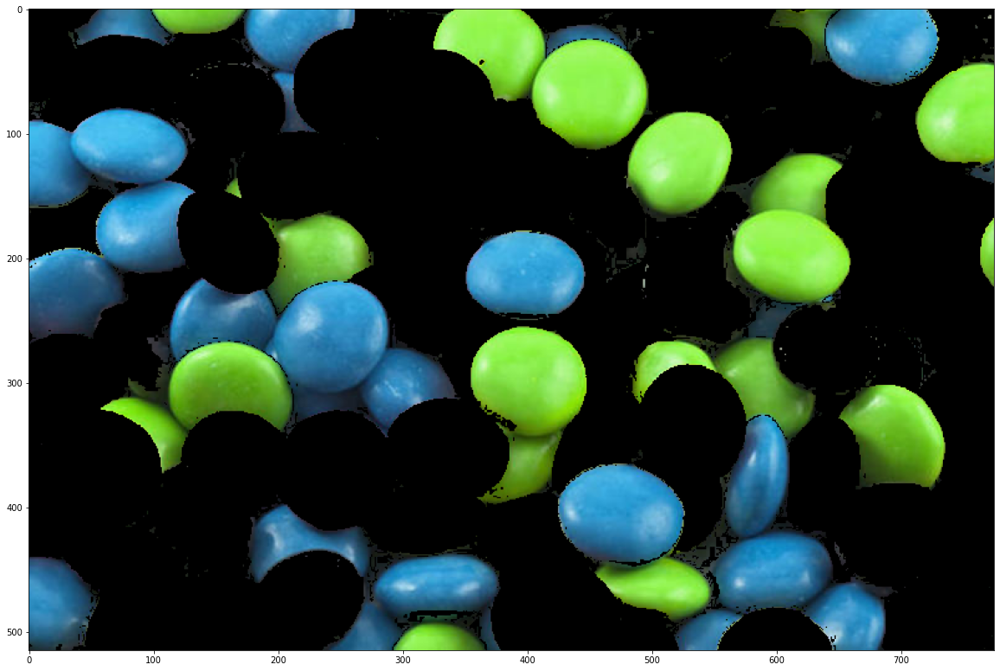

In [47]:
# Now combine both masks togheter so we can see all greens and blues in the same image!
combined = cv2.add(mask_blue, mask_green)
masked_field = img.copy()

masked_field[combined == 0] = [0, 0, 0]

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(masked_field,cv2.COLOR_BGR2RGB));

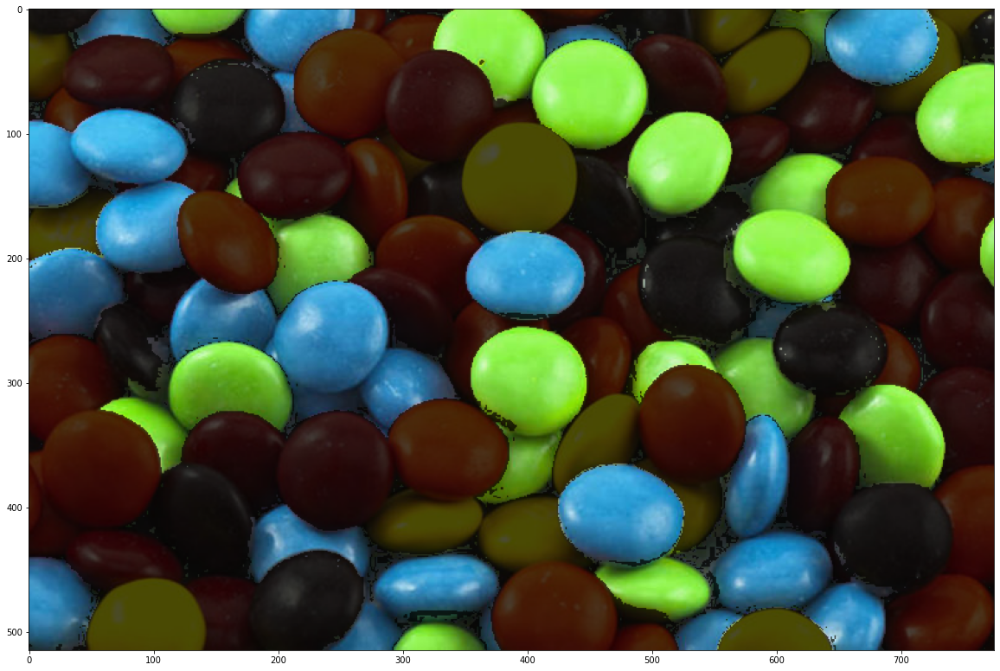

In [48]:
# Now lets combine both masks but also some opacity, we want to be able to see all M&Ms but
# Blues and greens will show as int he image above while the other colors will be faded out with some opacity
# You just need to add alpha to apply opacity to the dark parts of the mask, then display the image
background = img.copy()
black = np.zeros(masked_field.shape).astype('uint8')

opacity = 0.3
overlayed = cv2.addWeighted(background, opacity, masked_field, 1 - opacity, 0)

plt.figure(figsize = (20,15));
plt.imshow(cv2.cvtColor(overlayed,cv2.COLOR_BGR2RGB));

[Hint](# "cv2.addWeighted") 

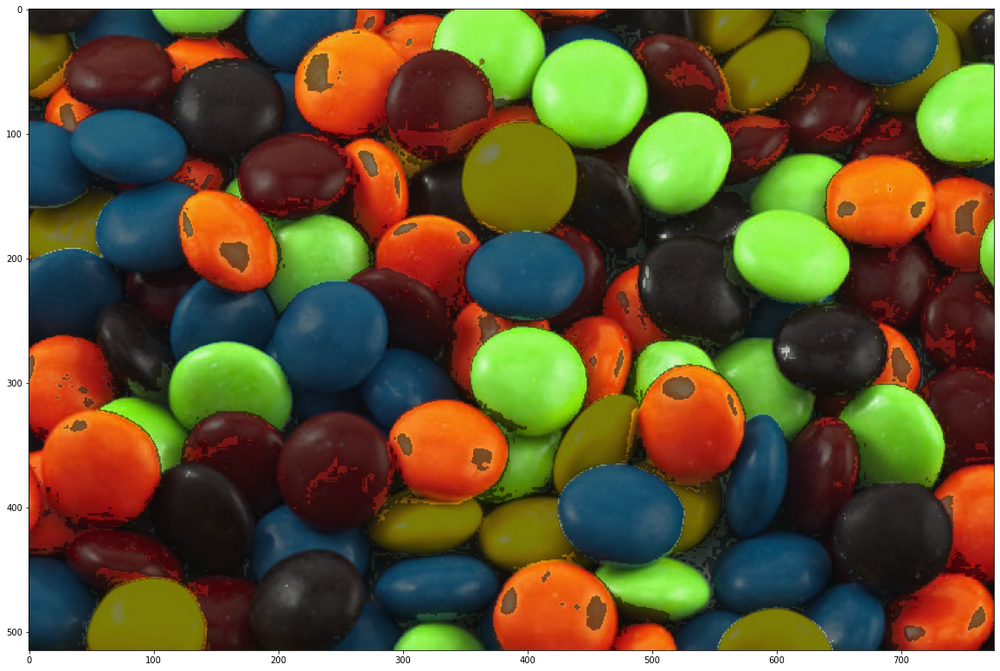

In [9]:
# Below you will find an example with oranges and greens just for reference so you can see what we want to accomplish
# In this example the oranges are not perfect, and it can be improved a lot easily.

## Mini project

### Level 1

#### Ball tracker

1. Given an image with a ball on it isolate the ball

### Level 2

#### Ball tracker

1. Make it track a ball in real time (either with a video or a webcam)

### Level 3

#### Ball Tracker

1. Can you make it track two or more different color balls at the same time?

In [6]:
video = cv2.VideoCapture(1)
l_blue = (93, 20, 0) #lower range of hsv map
u_blue = (138, 255, 255) #Retangular shapes on the hsv map

while(video.isOpened()):
    check, frame = video.read()
    if frame is not None:
        camera = frame
        
        hsv = cv2.cvtColor(camera, cv2.COLOR_BGR2HSV)

        blue_filter = cv2.inRange(hsv, l_blue, u_blue)
        masked_field = camera.copy()

        masked_field[blue_filter == 0] = [0, 0, 0]

        cv2.imshow('frame',masked_field)
        
       # if cv2.getWindowProperty('frame', cv.WND_PROP_VISIBLE) < 1:
          #  break  ## Closing the window while pressing exit
        if cv2.waitKey(30) & 0xFF == ord('q'):
            break
    else:
        break


video.release()
cv2.waitKey(0) 
cv2.destroyAllWindows()
cv2.waitKey(1)

-1

**Farrukh Bulbulov**